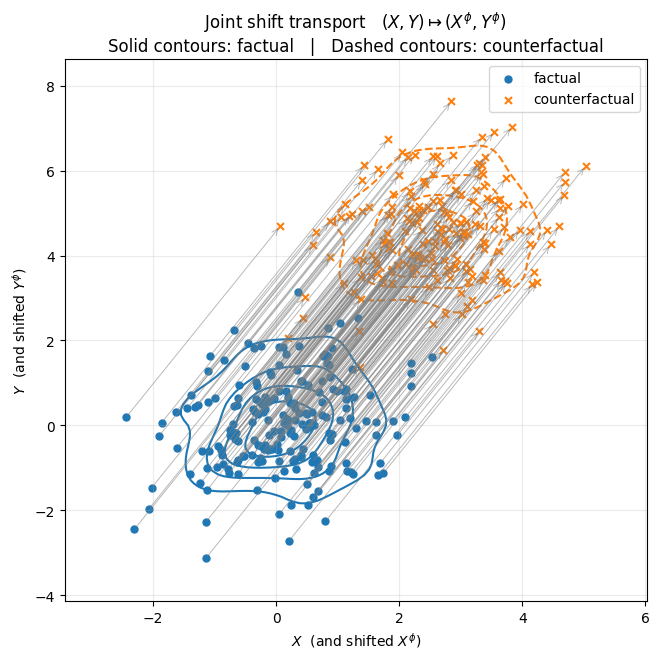

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# 1. Simulate weakly-correlated observational data
np.random.seed(1)
n = 200
X   = np.random.normal(0, 1, n)
eps = np.random.normal(0, 1, n)          # large noise -> weak corr
Y   = 0.3 * X + eps

# 2. Apply a larger joint shift intervention  φ : (X,Y) ↦ (X+Δx , Y+Δy)
dX, dY  = 2.5, 2.0
X_phi   = X + dX
Y_phi   = Y + dY+dX

# 3. KDEs for contour lines
xy, xy_phi   = np.vstack([X, Y]), np.vstack([X_phi, Y_phi])
kde, kde_phi = gaussian_kde(xy), gaussian_kde(xy_phi)

xmin, xmax = min(X.min(), X_phi.min()) - 1, max(X.max(), X_phi.max()) + 1
ymin, ymax = min(Y.min(), Y_phi.min()) - 1, max(Y.max(), Y_phi.max()) + 1
xx, yy     = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
grid       = np.vstack([xx.ravel(), yy.ravel()])
z, z_phi   = kde(grid).reshape(xx.shape), kde_phi(grid).reshape(xx.shape)
levels     = np.linspace(0, max(z.max(), z_phi.max()), 6)[1:]   # skip 0-level

# 4. Plot
fig, ax = plt.subplots(figsize=(6.7, 6.7))

ax.scatter(X, Y,           c="tab:blue",   s=25, label="factual")
ax.scatter(X_phi, Y_phi,   c="tab:orange", s=25, marker="x", label="counterfactual")

# Arrows from each factual point to its counterfactual twin
for x, y, xp, yp in zip(X, Y, X_phi, Y_phi):
    ax.annotate("", xy=(xp, yp), xytext=(x, y),
                arrowprops=dict(arrowstyle="->", color="grey", lw=0.7, alpha=0.55))

# Density contours
ax.contour(xx, yy, z,     levels=levels, linestyles="solid",  colors="tab:blue")
ax.contour(xx, yy, z_phi, levels=levels, linestyles="dashed", colors="tab:orange")

ax.set_xlabel(r"$X$  (and shifted $X^{\phi}$)")
ax.set_ylabel(r"$Y$  (and shifted $Y^{\phi}$)")
ax.set_title("Joint shift transport   $(X,Y)\\mapsto(X^{\\phi},Y^{\\phi})$\n"
             "Solid contours: factual   |   Dashed contours: counterfactual")
ax.legend()
ax.grid(alpha=0.25)
plt.tight_layout()
plt.show()

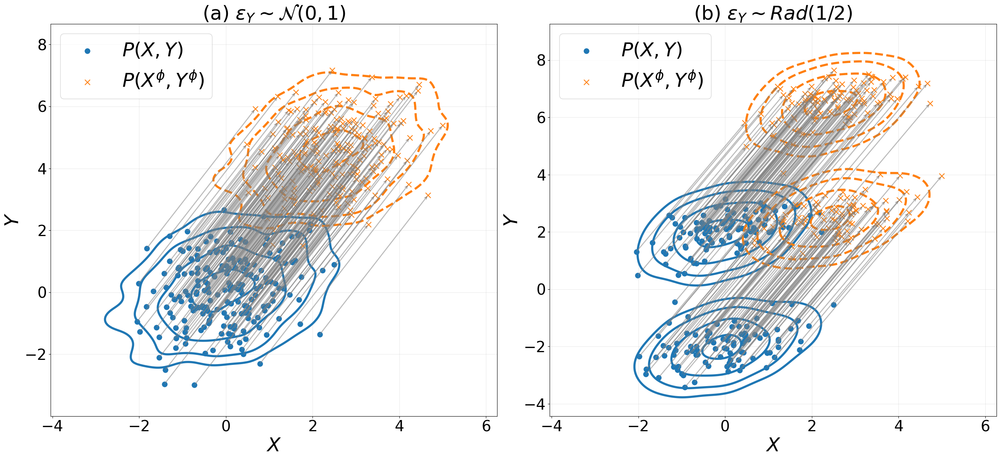

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

#plt.xkcd()

# ------------------------------------------------------------------
# 1) generate observational data (weakly correlated)
np.random.seed(0)
n_big, n_scatter = 1000, 200             # number of samples
X  = np.random.normal(0, 1, n_big)
eps_norm  = np.random.normal(0, 1, n_big)
B = np.random.binomial(1, 0.5, n_big)
eps_mix   = B * np.random.normal(-2, 0.5, n_big) + (1-B) * np.random.normal(2, 0.5, n_big)

Y_norm = 0.3 * X + eps_norm               # (a) Gaussian noise case
Y_mix  = 0.3 * X + eps_mix                # (b) mixture noise case

# choose same subset for arrows on both panels
idx = np.random.choice(n_big, n_scatter, replace=False)

# intervention parameters
dX, dY = 2.5, 2.0
def shift_pair(X, Y):        # returns (Xφ ,Yφ)
    Xφ = X + dX
    Yφ = Y + dY + dX
    return Xφ, Yφ

# ------------------------------------------------------------------
def make_panel(ax, X, Y, label, *, grid_pts=250j, arrow_idx=None):
    """Plot scatter + arrows + paired KDE contours on supplied axis"""
    Xφ, Yφ = shift_pair(X, Y)

    # KDE over the full data
    xy      = np.vstack([X, Y])
    xyφ     = np.vstack([Xφ, Yφ])
    kde     = gaussian_kde(xy)
    kdeφ    = gaussian_kde(xyφ)

    xmin, xmax = min(X.min(), Xφ.min())-1, max(X.max(), Xφ.max())+1
    ymin, ymax = min(Y.min(), Yφ.min())-1, max(Y.max(), Yφ.max())+1
    xx, yy     = np.mgrid[xmin:xmax:grid_pts, ymin:ymax:grid_pts]
    grid       = np.vstack([xx.ravel(), yy.ravel()])
    z, zφ      = kde(grid).reshape(xx.shape), kdeφ(grid).reshape(xx.shape)

    # quantile-based contour levels
    levels = np.quantile(np.hstack([z.ravel(), zφ.ravel()]),
                         [0.85, 0.9, 0.95, 0.99])

    # scatter / arrows on subset
    if arrow_idx is None:
        arrow_idx = np.arange(len(X))
    ax.scatter(X[arrow_idx], Y[arrow_idx], c="tab:blue", s=90, label=r"$P(X,Y)$")  # larger points
    ax.scatter(Xφ[arrow_idx], Yφ[arrow_idx], c="tab:orange", s=95, marker="x", label=r"$P(X^{\phi}, Y^{\phi})$")

    for i in arrow_idx:
        ax.annotate("", xy=(Xφ[i], Yφ[i]), xytext=(X[i], Y[i]),
                    arrowprops=dict(arrowstyle="->", color="grey", lw=1.8, alpha=0.55))  # thicker arrows

    # contours
    ax.contour(xx, yy, z,  levels=levels, linestyles="solid",  colors="tab:blue", linewidths=4.0)
    ax.contour(xx, yy, zφ, levels=levels, linestyles="dashed", colors="tab:orange", linewidths=4.0)

    ax.set_xlabel(r"$X$", fontsize=36)
    ax.set_ylabel(r"$Y$", fontsize=36)
    ax.set_title(label, fontsize=36)
    ax.tick_params(labelsize=28)
    ax.grid(alpha=0.25)
    ax.legend(fontsize=36)

# ------------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(26, 12))  # Doubled figure size

make_panel(
    axes[0], X, Y_norm,
    r"(a) $\varepsilon_Y \sim \mathcal{N}(0,1)$",
    arrow_idx=idx
)

make_panel(
    axes[1], X, Y_mix,
    r"(b) $\varepsilon_Y \sim Rad(1/2)$",
    arrow_idx=idx
)

plt.tight_layout()
plt.savefig("Noise_invariance_2d", bbox_inches = "tight")
plt.show()

/tmp/ipykernel_25666/4048074932.py:61: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[arrow_idx],  Y[arrow_idx],  c=palette[0], s=100, label=r'$P(X,Y)$', edgecolor='black')
/tmp/ipykernel_25666/4048074932.py:62: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Xφ[arrow_idx], Yφ[arrow_idx], c=palette[1], s=100, marker='X', label=r'$P(X^\phi,Y^\phi)$', edgecolor='black')


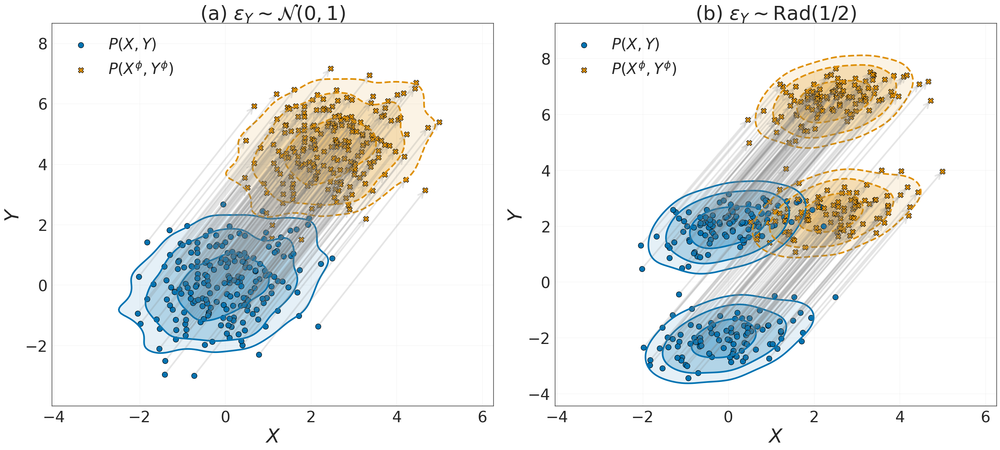

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Suppress font_manager messages
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style and colorblind palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 2)  # two colors: original vs intervened

# Data generation
np.random.seed(0)
n_big, n_scatter = 1000, 200
X  = np.random.normal(0, 1, n_big)
eps_norm = np.random.normal(0, 1, n_big)
B = np.random.binomial(1, 0.5, n_big)
eps_mix = B * np.random.normal(-2, 0.5, n_big) + (1-B) * np.random.normal(2, 0.5, n_big)
Y_norm = 0.3 * X + eps_norm
Y_mix  = 0.3 * X + eps_mix
idx = np.random.choice(n_big, n_scatter, replace=False)

# Intervention shift
dX, dY = 2.5, 2.0
def shift_pair(X, Y):
    Xφ = X + dX
    Yφ = Y + dY + dX
    return Xφ, Yφ

def make_panel(ax, X, Y, title, arrow_idx):
    Xφ, Yφ = shift_pair(X, Y)

    # KDEs
    kde   = gaussian_kde(np.vstack([X, Y]))
    kdeφ  = gaussian_kde(np.vstack([Xφ, Yφ]))
    xmin, xmax = min(X.min(), Xφ.min())-1, max(X.max(), Xφ.max())+1
    ymin, ymax = min(Y.min(), Yφ.min())-1, max(Y.max(), Yφ.max())+1
    xx, yy = np.mgrid[xmin:xmax:200j, ymin:ymax:200j]
    grid = np.vstack([xx.ravel(), yy.ravel()])
    z   = kde(grid).reshape(xx.shape)
    zφ  = kdeφ(grid).reshape(xx.shape)

    # contour levels by quantile
    levels = np.quantile(np.hstack([z.ravel(), zφ.ravel()]), [0.875,0.925,0.975])

    # progressive shading: dark->light
    alphas = [0.1, 0.3, 0.5]
    for data, color, linestyle in [(z, palette[0], 'solid'), (zφ, palette[1], 'dashed')]:
        for i in range(len(levels)):
            low = levels[i]
            high = 1 if i==len(levels)-1 else levels[i+1]
            ax.contourf(xx, yy, data, levels=[low, high],
                        colors=[color], alpha=alphas[i], antialiased=True)
        ax.contour(xx, yy, data, levels=levels,
                   colors=[color], linestyles=linestyle, linewidths=3)

    # scatter and arrows
    ax.scatter(X[arrow_idx],  Y[arrow_idx],  c=palette[0], s=100, label=r'$P(X,Y)$', edgecolor='black')
    ax.scatter(Xφ[arrow_idx], Yφ[arrow_idx], c=palette[1], s=100, marker='X', label=r'$P(X^\phi,Y^\phi)$', edgecolor='black')
    for i in arrow_idx:
        ax.annotate("", xy=(Xφ[i],Yφ[i]), xytext=(X[i],Y[i]),
                    arrowprops=dict(arrowstyle="->", color="grey", lw=3, alpha=0.2))
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_title(title, fontsize=36)
    ax.set_xlabel(r"$X$", fontsize=36)
    ax.set_ylabel(r"$Y$", fontsize=36)
    ax.tick_params(labelsize=28)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=28, frameon=False)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(26, 12))

make_panel(axes[0], X, Y_norm, r"(a) $\varepsilon_Y \sim \mathcal{N}(0,1)$", idx)
make_panel(axes[1], X, Y_mix,  r"(b) $\varepsilon_Y \sim \text{Rad}(1/2)$", idx)

plt.tight_layout()
plt.savefig("Noise_invariance_2d_formatted.png", bbox_inches="tight")
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm        # NEW

# Suppress font_manager messages
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style and colour-blind palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 2)  # two colours: original vs intervened

# -------------------------------  data  ------------------------------------- #
np.random.seed(0)
n_big, n_scatter = 1000, 200
X  = np.random.normal(0, 1, n_big)

# Normal noise case
eps_norm = np.random.normal(0, 1, n_big)
Y_norm   = 0.3 * X + eps_norm

# Mixture noise case
B        = np.random.binomial(1, 0.5, n_big)
eps_mix  = B * np.random.normal(-2, 0.5, n_big) + (1-B) * np.random.normal(2, 0.5, n_big)
Y_mix    = 0.3 * X + eps_mix

idx = np.random.choice(n_big, n_scatter, replace=False)

# -------------------------  intervention helper  ---------------------------- #
dX, dY = 2.5, 2.0
def shift_pair(X, Y):
    Xφ = X + dX
    Yφ = Y + dY + dX
    return Xφ, Yφ

# ---------------------------  analytic densities  --------------------------- #
def pdf_norm(xx, yy):
    """p(x) * p(ε) with ε = y − 0.3x and ε ~ N(0,1)."""
    return norm.pdf(xx) * norm.pdf(yy - 0.3*xx)

def pdf_mix(xx, yy):
    """0.5 N(−2,0.5²) + 0.5 N(+2,0.5²) for ε, times p(x)."""
    eps = yy - 0.3*xx
    p_eps = 0.5*norm.pdf(eps,  -2, 0.5) + 0.5*norm.pdf(eps,   2, 0.5)
    return norm.pdf(xx) * p_eps

# -----------------------------  plotting  ----------------------------------- #
def make_panel(ax, X, Y, pdf_fn, title, arrow_idx):
    Xφ, Yφ = shift_pair(X, Y)

    # Evaluation grid
    xmin, xmax = min(X.min(), Xφ.min())-1, max(X.max(), Xφ.max())+1
    ymin, ymax = min(Y.min(), Yφ.min())-1, max(Y.max(), Yφ.max())+1
    xx, yy     = np.mgrid[xmin:xmax:200j, ymin:ymax:200j]

    z   = pdf_fn(xx, yy)
    zφ  = pdf_fn(xx - dX, yy - dY - dX)  # pdf under intervention

    # Contour levels by HDR (use combined pdf to find cut-offs)
    levels = np.quantile(np.hstack([z.ravel(), zφ.ravel()]), [0.875, 0.925, 0.975])

    # progressive shading: dark→light
    alphas = [0.1, 0.3, 0.5]
    for data, color, linestyle in [(z, palette[0], 'solid'),
                                  (zφ, palette[1], 'dashed')]:
        for i in range(len(levels)):
            low  = levels[i]
            high = 1 if i == len(levels)-1 else levels[i+1]
            ax.contourf(xx, yy, data, levels=[low, high],
                        colors=[color], alpha=alphas[i], antialiased=True)
        ax.contour(xx, yy, data, levels=levels,
                   colors=[color], linestyles=linestyle, linewidths=3)

    # scatter and arrows
    ax.scatter(X[arrow_idx],  Y[arrow_idx],  c=palette[0], s=100,
               label=r'$P(X,Y)$', edgecolor='black')
    ax.scatter(Xφ[arrow_idx], Yφ[arrow_idx], c=palette[1], s=100, marker='X',
               label=r'$P(X^\phi,Y^\phi)$', edgecolor='black')
    for i in arrow_idx:
        ax.annotate("", xy=(Xφ[i],Yφ[i]), xytext=(X[i],Y[i]),
                    arrowprops=dict(arrowstyle="->", color="grey", lw=3, alpha=0.2))

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_title(title, fontsize=36)
    ax.set_xlabel(r"$X$", fontsize=36)
    ax.set_ylabel(r"$Y$", fontsize=36)
    ax.tick_params(labelsize=28)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=28, frameon=False)

# figure
fig, axes = plt.subplots(1, 2, figsize=(26, 12))

make_panel(axes[0], X, Y_norm, pdf_norm,
           r"(a) $\varepsilon_Y \sim \mathcal{N}(0,1)$", idx)
make_panel(axes[1], X, Y_mix,  pdf_mix,
           r"(b) $\varepsilon_Y \sim \text{Rad}(1/2)$", idx)

plt.tight_layout()
plt.savefig("Noise_invariance_2d_formatted_trueContours.png", bbox_inches="tight")
plt.show()

/tmp/ipykernel_1429300/2838198460.py:77: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[arrow_idx],  Y[arrow_idx],  c=palette[0], s=100,
/tmp/ipykernel_1429300/2838198460.py:79: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Xφ[arrow_idx], Yφ[arrow_idx], c=palette[1], s=100, marker='X',


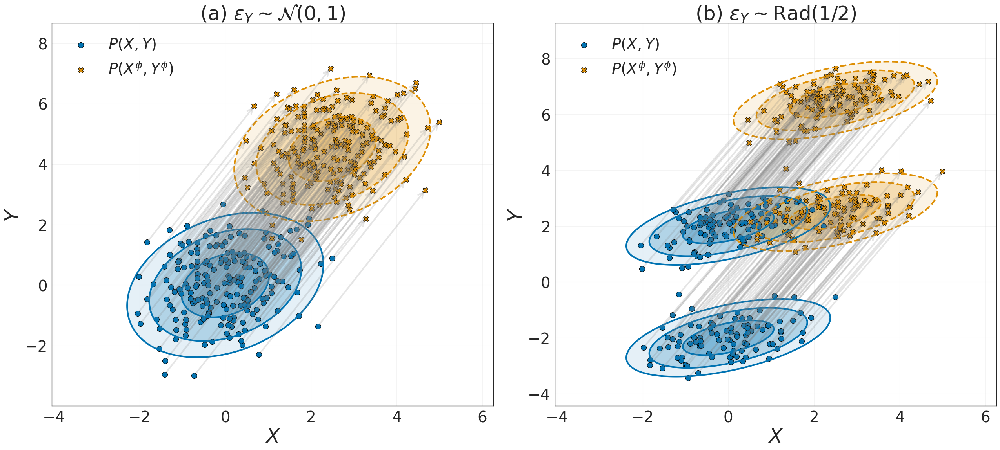

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm        # NEW

# Suppress font_manager messages
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style and colour-blind palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 2)  # two colours: original vs intervened

# -------------------------------  data  ------------------------------------- #
np.random.seed(0)
n_big, n_scatter = 1000, 200
X  = np.random.normal(0, 1, n_big)

# Normal noise case
eps_norm = np.random.normal(0, 1, n_big)
Y_norm   = 0.3 * X + eps_norm

# Mixture noise case
B        = np.random.binomial(1, 0.5, n_big)
eps_mix  = B * np.random.normal(-2, 0.5, n_big) + (1-B) * np.random.normal(2, 0.5, n_big)
Y_mix    = 0.3 * X + eps_mix

idx = np.random.choice(n_big, n_scatter, replace=False)

# -------------------------  intervention helper  ---------------------------- #
dX, dY = 2.5, 2.0
def shift_pair(X, Y):
    Xφ = X + dX
    Yφ = Y + dY + dX
    return Xφ, Yφ

# ---------------------------  analytic densities  --------------------------- #
def pdf_norm(xx, yy):
    """p(x) * p(ε) with ε = y − 0.3x and ε ~ N(0,1)."""
    return norm.pdf(xx) * norm.pdf(yy - 0.3*xx)

def pdf_mix(xx, yy):
    """0.5 N(−2,0.5²) + 0.5 N(+2,0.5²) for ε, times p(x)."""
    eps = yy - 0.3*xx
    p_eps = 0.5*norm.pdf(eps,  -2, 0.5) + 0.5*norm.pdf(eps,   2, 0.5)
    return norm.pdf(xx) * p_eps

# -----------------------------  plotting  ----------------------------------- #
def make_panel(ax, X, Y, pdf_fn, title, arrow_idx):
    Xφ, Yφ = shift_pair(X, Y)

    # Evaluation grid
    xmin, xmax = min(X.min(), Xφ.min())-1, max(X.max(), Xφ.max())+1
    ymin, ymax = min(Y.min(), Yφ.min())-1, max(Y.max(), Yφ.max())+1
    xx, yy     = np.mgrid[xmin:xmax:200j, ymin:ymax:200j]

    z   = pdf_fn(xx, yy)
    zφ  = pdf_fn(xx - dX, yy - dY - dX)  # pdf under intervention

    # Contour levels by HDR (use combined pdf to find cut-offs)
    levels = np.quantile(np.hstack([z.ravel(), zφ.ravel()]), [0.875, 0.925, 0.975])

    # progressive shading: dark→light
    alphas = [0.1, 0.3, 0.5]
    for data, color, linestyle in [(z, palette[0], 'solid'),
                                  (zφ, palette[1], 'dashed')]:
        for i in range(len(levels)):
            low  = levels[i]
            high = 1 if i == len(levels)-1 else levels[i+1]
            ax.contourf(xx, yy, data, levels=[low, high],
                        colors=[color], alpha=alphas[i], antialiased=True)
        ax.contour(xx, yy, data, levels=levels,
                   colors=[color], linestyles=linestyle, linewidths=3)

    # scatter and arrows
    ax.scatter(X[arrow_idx],  Y[arrow_idx],  c=palette[0], s=100,
               label=r'$P(X,Y)$', edgecolor='black')
    ax.scatter(Xφ[arrow_idx], Yφ[arrow_idx], c=palette[1], s=100, marker='X',
               label=r'$P(X^\phi,Y^\phi)$', edgecolor='black')
    for i in arrow_idx:
        ax.annotate("", xy=(Xφ[i],Yφ[i]), xytext=(X[i],Y[i]),
                    arrowprops=dict(arrowstyle="->", color="grey", lw=3, alpha=0.2))

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_title(title, fontsize=36)
    ax.set_xlabel(r"$X$", fontsize=36)
    ax.set_ylabel(r"$Y$", fontsize=36)
    ax.tick_params(labelsize=28)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=28, frameon=False)

# figure
fig, axes = plt.subplots(1, 2, figsize=(26, 12))

make_panel(axes[0], X, Y_norm, pdf_norm,
           r"(a) $\varepsilon_Y \sim \mathcal{N}(0,1)$", idx)
make_panel(axes[1], X, Y_mix,  pdf_mix,
           r"(b) $\varepsilon_Y \sim \text{Rad}(1/2)$", idx)

plt.tight_layout()
plt.savefig("Noise_invariance_2d_formatted_trueContours.png", bbox_inches="tight")
plt.show()

/tmp/ipykernel_2308106/3251519887.py:109: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Y[arrow_idx,0],  Y[arrow_idx,1],  c=palette[0], s=100,
/tmp/ipykernel_2308106/3251519887.py:111: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Yφ[arrow_idx,0], Yφ[arrow_idx,1], c=palette[1], s=100, marker='X',


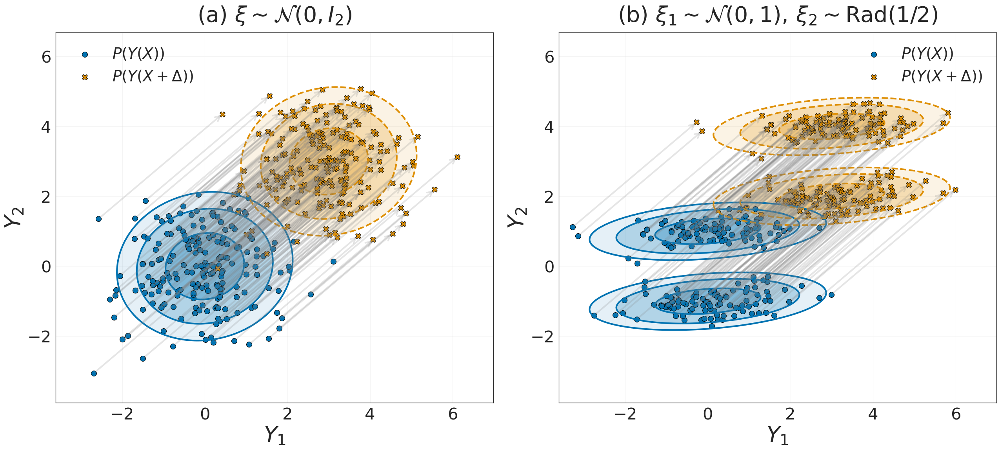

In [31]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, multivariate_normal

# Suppress font_manager messages
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style and colour‐blind palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 2)  # observational vs interventional

# -------------------------------  data  ------------------------------------- #
np.random.seed(0)
n_big, n_scatter = 1000, 200

# Input
X = np.random.normal(0, 1, size=n_big)

# Linear map A (2×1)
A = np.array([[0.3],
              [0.3]])

# How big a shift in X you want:
delta = 10.0   # <-- change this to any shift size you like

# --- noise case (a): U ~ N(0, I_2) ------------------
U_norm = np.random.normal(0, 1, size=(n_big, 2))
Y_norm = (X * A).T + U_norm  # (n_big, 2)

# --- noise case (b): U1~N(0,1), U2~Rademacher(±1) ---
U1 = np.random.normal(0, 1, size=n_big)
U2 = np.random.choice([-1, 1], size=n_big)
Y_mix = (X * A).T + np.column_stack([U1, U2])

# compute the shifted clouds for axis limits
Yφ_norm = Y_norm + delta * A.T
Yφ_mix  = Y_mix  + delta * A.T

# global y1/y2 limits
pad = 0.0
y1_min = min(Y_norm[:,0].min(), Yφ_norm[:,0].min(),
             Y_mix[:,0].min(),  Yφ_mix[:,0].min()) - pad
y1_max = max(Y_norm[:,0].max(), Yφ_norm[:,0].max(),
             Y_mix[:,0].max(),  Yφ_mix[:,0].max()) + pad
y2_min = min(Y_norm[:,1].min(), Yφ_norm[:,1].min(),
             Y_mix[:,1].min(),  Yφ_mix[:,1].min()) - pad
y2_max = max(Y_norm[:,1].max(), Yφ_norm[:,1].max(),
             Y_mix[:,1].max(),  Yφ_mix[:,1].max()) + pad

# compute original spans
span1 = y1_max - y1_min
span2 = y2_max - y2_min

# pick the larger span
max_span = max(span1, span2)

# compute mid-points
mid1 = 0.5*(y1_max + y1_min)
mid2 = 0.5*(y2_max + y2_min)

# build new, equalized limits
y1_min, y1_max = mid1 - 0.5*max_span, mid1 + 0.5*max_span
y2_min, y2_max = mid2 - 0.5*max_span, mid2 + 0.5*max_span

# random subset for arrows
idx = np.random.choice(n_big, n_scatter, replace=False)

# ---------------------------  analytic densities  --------------------------- #
cov = A @ A.T + np.eye(2)
mvnorm = multivariate_normal(mean=[0, 0], cov=cov)
def pdf_norm(y1, y2):
    pos = np.stack([y1, y2], axis=-1)
    return mvnorm.pdf(pos)

A1, A2 = A[0,0], A[1,0]
def pdf_mix(y1, y2):
    p = np.zeros_like(y1)
    for u2 in [-1, +1]:
        x_val = (y2 - u2) / A2
        p += 0.5 * norm.pdf(x_val) * norm.pdf(y1 - A1*x_val) / abs(A2)
    return p

# -----------------------------  plotting  ----------------------------------- #
def make_panel(ax, Y, pdf_fn, title, arrow_idx):
    Yφ = Y + delta * A.T

    # shared grid
    y1g, y2g = np.mgrid[y1_min:y1_max:200j, y2_min:y2_max:200j]

    z   = pdf_fn(y1g, y2g)
    zφ  = pdf_fn(y1g - delta*A1, y2g - delta*A2)

    levels = np.quantile(np.hstack([z.ravel(), zφ.ravel()]), [0.875, 0.925, 0.975])
    alphas = [0.1, 0.3, 0.5]

    for data, color, ls in [(z, palette[0], 'solid'),
                            (zφ, palette[1], 'dashed')]:
        for i in range(len(levels)):
            low = levels[i]
            high = 1 if i == len(levels)-1 else levels[i+1]
            ax.contourf(y1g, y2g, data, levels=[low, high],
                        colors=[color], alpha=alphas[i], antialiased=True)
        ax.contour(y1g, y2g, data, levels=levels,
                   colors=[color], linestyles=ls, linewidths=3)

    ax.scatter(Y[arrow_idx,0],  Y[arrow_idx,1],  c=palette[0], s=100,
               label=r'$P(Y(X))$', edgecolor='black')
    ax.scatter(Yφ[arrow_idx,0], Yφ[arrow_idx,1], c=palette[1], s=100, marker='X',
               label=r'$P(Y(X+\Delta))$', edgecolor='black')
    for i in arrow_idx:
        ax.annotate("", xy=(Yφ[i,0],Yφ[i,1]),
                    xytext=(Y[i,0],Y[i,1]),
                    arrowprops=dict(arrowstyle="->", color="grey", lw=3, alpha=0.2))

    ax.set_xlim(y1_min, y1_max)
    ax.set_ylim(y2_min, y2_max)
    #ax.set_aspect('equal', adjustable='box')   # enforce equal aspect ratio
    ax.set_title(title, fontsize=40, pad = 20)
    ax.set_xlabel(r"$Y_1$", fontsize=40)
    ax.set_ylabel(r"$Y_2$", fontsize=40)
    ax.tick_params(labelsize=30)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=28, frameon=False)

# draw figure
fig, axes = plt.subplots(1, 2, figsize=(26, 12))
make_panel(axes[0], Y_norm, pdf_norm,
           r"(a) $\xi \sim \mathcal{N}(0,I_2)$", idx)
make_panel(axes[1], Y_mix,  pdf_mix,
           r"(b) $\xi_1\sim\mathcal{N}(0,1),\,\xi_2\sim\mathrm{Rad}(1/2)$", idx)

plt.tight_layout()
plt.savefig("Noise_invariance_Y2d_sharedAxes_equalAspect.png", bbox_inches="tight")
plt.show()

/tmp/ipykernel_3303796/3164957874.py:117: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Y[arrow_idx,0],  Y[arrow_idx,1],  c=palette[0],
/tmp/ipykernel_3303796/3164957874.py:119: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Yφ[arrow_idx,0], Yφ[arrow_idx,1], c=palette[1],


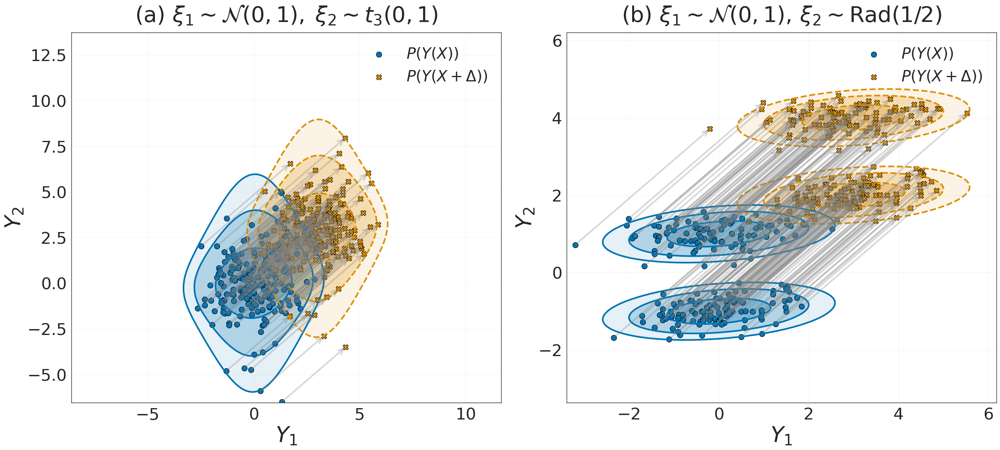

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, multivariate_normal, t
from scipy.integrate import quad

# Suppress font_manager messages
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style and colour‐blind palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 2)  # observational vs interventional

# -------------------------------  data  ------------------------------------- #
np.random.seed(1)
n_big, n_scatter = 1000, 200

# Input
X = np.random.normal(0, 1, size=n_big)

# Linear map A (2×1)
A = np.array([[0.3],
              [0.3]])
A1, A2 = A[0,0], A[1,0]

# How big a shift in X you want:
delta = 10.0   # <-- change this to any shift size you like
df = 3

# --- noise case (a): U₁~N(0,1), U₂~Student-t(df=df) ------------------
U1 = np.random.normal(0, 1, size=n_big)
U2 = np.random.standard_t(df=df, size=n_big)
Y_norm = (X * A).T + np.column_stack([U1, U2])  # (n_big, 2)

# --- noise case (b): U1~N(0,1), U2~Rademacher(±1) ------------------
U1_b = np.random.normal(0, 1, size=n_big)
U2_b = np.random.choice([-1, 1], size=n_big)
Y_mix = (X * A).T + np.column_stack([U1_b, U2_b])

# compute the shifted clouds for limits
Yφ_norm = Y_norm + delta * A.T
Yφ_mix  = Y_mix  + delta * A.T

# helper to get equal‐span limits for one panel
def get_limits(Y, Yphi, pad=0.0):
    y1_min = min(Y[:,0].min(),  Yphi[:,0].min()) - pad
    y1_max = max(Y[:,0].max(),  Yphi[:,0].max()) + pad
    y2_min = min(Y[:,1].min(),  Yphi[:,1].min()) - pad
    y2_max = max(Y[:,1].max(),  Yphi[:,1].max()) + pad
    span = max(y1_max - y1_min, y2_max - y2_min)
    mid1 = 0.5*(y1_max + y1_min)
    mid2 = 0.5*(y2_max + y2_min)
    return (mid1 - 0.5*span, mid1 + 0.5*span,
            mid2 - 0.5*span, mid2 + 0.5*span)

# per‐panel limits
lims_norm = get_limits(Y_norm, Yφ_norm)
lims_mix  = get_limits(Y_mix,  Yφ_mix)

# random subset for arrows
idx = np.random.choice(n_big, n_scatter, replace=False)

# ---------------------------  analytic densities  --------------------------- #
cov = A @ A.T + np.eye(2)
mvnorm = multivariate_normal(mean=[0, 0], cov=cov)

N = 100
nodes, weights = np.polynomial.hermite.hermgauss(N)
# adjust for the exp(-x^2/2) weight of the normal density:
x_i = nodes * np.sqrt(2)
w_i = weights / np.sqrt(np.pi)

def pdf_norm(y1, y2):
    # y1,y2 are 2D grids
    Xg = x_i[:,None,None]
    Wg = w_i[:,None,None]
    term1 = np.exp(-((y1 - A1*Xg)**2)/2) / np.sqrt(2*np.pi)
    term2 = t.pdf(y2 - A2*Xg, df=df)
    return np.sum(Wg * term1 * term2, axis=0)

def pdf_mix(y1, y2):
    p = np.zeros_like(y1)
    for u2 in [-1, +1]:
        x_val = (y2 - u2) / A2
        p += 0.5 * norm.pdf(x_val) * norm.pdf(y1 - A1*x_val) / abs(A2)
    return p

# -----------------------------  plotting  ----------------------------------- #
def make_panel(ax, Y, pdf_fn, title, arrow_idx,
               y1_min, y1_max, y2_min, y2_max):
    Yφ = Y + delta * A.T

    # mesh unique to this panel
    y1g, y2g = np.mgrid[y1_min:y1_max:200j,
                        y2_min:y2_max:200j]

    z   = pdf_fn(y1g, y2g)
    zφ  = pdf_fn(y1g - delta*A1, y2g - delta*A2)

    levels = np.quantile(np.hstack([z.ravel(), zφ.ravel()]),
                         [0.875, 0.925, 0.975])
    alphas = [0.1, 0.3, 0.5]

    for data, color, ls in [(z, palette[0], 'solid'),
                            (zφ, palette[1], 'dashed')]:
        for i in range(len(levels)):
            low  = levels[i]
            high = 1 if i == len(levels)-1 else levels[i+1]
            ax.contourf(y1g, y2g, data, levels=[low, high],
                        colors=[color], alpha=alphas[i],
                        antialiased=True)
        ax.contour(y1g, y2g, data, levels=levels,
                   colors=[color], linestyles=ls, linewidths=3)

    ax.scatter(Y[arrow_idx,0],  Y[arrow_idx,1],  c=palette[0],
               s=100, label=r'$P(Y(X))$', edgecolor='black')
    ax.scatter(Yφ[arrow_idx,0], Yφ[arrow_idx,1], c=palette[1],
               s=100, marker='X', label=r'$P(Y(X+\Delta))$',
               edgecolor='black')

    for i in arrow_idx:
        ax.annotate("", xy=(Yφ[i,0],Yφ[i,1]),
                    xytext=(Y[i,0],Y[i,1]),
                    arrowprops=dict(arrowstyle="->",
                                    color="grey", lw=3, alpha=0.3))

    ax.set_xlim(y1_min, y1_max)
    ax.set_ylim(y2_min, y2_max)
    ax.set_title(title, fontsize=40, pad=20)
    ax.set_xlabel(r"$Y_1$", fontsize=40)
    ax.set_ylabel(r"$Y_2$", fontsize=40)
    ax.tick_params(labelsize=30)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=28, frameon=False)

# draw figure
fig, axes = plt.subplots(1, 2, figsize=(26, 12))
make_panel(axes[0], Y_norm, pdf_norm,
           r"(a) $\xi_1\sim\mathcal{N}(0,1),\;\xi_2\sim t_{3}(0,1)$", idx,
           *lims_norm)
make_panel(axes[1], Y_mix,  pdf_mix,
           r"(b) $\xi_1\sim\mathcal{N}(0,1),\,\xi_2\sim\mathrm{Rad}(1/2)$", idx,
           *lims_mix)

plt.tight_layout()
plt.savefig("Noise_invariance_Y2d_sharedAxes_equalAspect.png",
            bbox_inches="tight")
plt.show()


/tmp/ipykernel_3303796/2800116178.py:98: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Y0[arrow_idx,0], Y0[arrow_idx,1], c=palette[0], s=100, label=r'$P(Y(0))$', edgecolor='black')
/tmp/ipykernel_3303796/2800116178.py:99: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Y1[arrow_idx,0], Y1[arrow_idx,1], c=palette[1], s=100, marker='X', label=r'$P(Y(10))$', edgecolor='black')


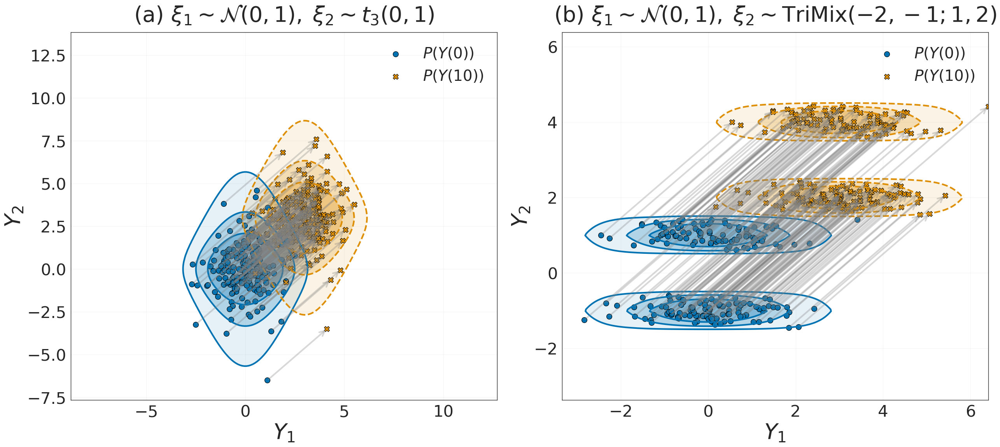

In [31]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, t

# Suppress font_manager messages
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style and colour‐blind palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 2)

# -------------------------------  data  -------------------------------------
np.random.seed(1)
n_big, n_scatter = 1000, 200

# Linear map A (2×1)
A = np.array([[0.3],
              [0.3]])
A1, A2 = A[0,0], A[1,0]

delta = 10.0   # shift from x=0 to x=10
df = 3

# --- noise case (a): U₁~N(0,1), U₂~Student-t(df=df)
U1 = np.random.normal(0, 1, size=n_big)
U2 = np.random.standard_t(df=df, size=n_big)
Y0_norm  = np.column_stack([U1, U2])           # Y at x=0
Y10_norm = Y0_norm + delta * A.T               # Y at x=10

# --- noise case (b): U₁~N(0,1), U₂~Mixture of triangulars ----------------
U1_b = np.random.normal(0, 1, size=n_big)
flip = np.random.rand(n_big) < 0.5
# triangular on [-2,-1] and [1,2] with mode at midpoints
U2_b = np.where(
    flip,
    np.random.triangular(-1.5, -1, -0.5, size=n_big),
    np.random.triangular(0.5,  1,  1.5, size=n_big)
)
Y0_mix  = np.column_stack([U1_b, U2_b])        # Y at x=0
Y10_mix = Y0_mix + delta * A.T                 # Y at x=10

# helper to get equal‐span limits for one panel
def get_limits(Y0, Y1, pad=0.0):
    y1_min = min(Y0[:,0].min(), Y1[:,0].min()) - pad
    y1_max = max(Y0[:,0].max(), Y1[:,0].max()) + pad
    y2_min = min(Y0[:,1].min(), Y1[:,1].min()) - pad
    y2_max = max(Y0[:,1].max(), Y1[:,1].max()) + pad
    span = max(y1_max - y1_min, y2_max - y2_min)
    mid1 = 0.5*(y1_max + y1_min)
    mid2 = 0.5*(y2_max + y2_min)
    return (mid1 - 0.5*span, mid1 + 0.5*span,
            mid2 - 0.5*span, mid2 + 0.5*span)

lims_norm = get_limits(Y0_norm, Y10_norm)
lims_mix  = get_limits(Y0_mix,  Y10_mix)

# random subset for arrows
idx = np.random.choice(n_big, n_scatter, replace=False)

# triangular PDF helper
def tri_pdf(u, a, b):
    m = 0.5 * (a + b)
    base = b - a
    dens = np.zeros_like(u)
    left = (u >= a) & (u <  m)
    dens[left] = 2 * (u[left] - a) / (base**2)
    right = (u >= m) & (u <= b)
    dens[right] = 2 * (b - u[right]) / (base**2)
    return dens

# -----------------------------  analytic densities  ---------------------------
def pdf_norm(y1, y2):
    # exact: product of marginals
    return norm.pdf(y1) * t.pdf(y2, df=df)

def pdf_mix(y1, y2):
    # exact: Gaussian for y1, mixture of triangular for y2
    mix_tri = 0.5 * tri_pdf(y2, -1.5, -0.5) + 0.5 * tri_pdf(y2, 0.5, 1.5)
    return norm.pdf(y1) * mix_tri

# -----------------------------  plotting  -----------------------------------
def make_panel(ax, Y0, Y1, pdf_fn, title, arrow_idx, y1_min, y1_max, y2_min, y2_max):
    y1g, y2g = np.mgrid[y1_min:y1_max:200j,
                        y2_min:y2_max:200j]
    z0 = pdf_fn(y1g, y2g)
    z1 = pdf_fn(y1g - delta*A1, y2g - delta*A2)
    levels = np.quantile(np.hstack([z0.ravel(), z1.ravel()]), [0.9, 0.95, 0.975])
    alphas = [0.1, 0.3, 0.5]
    for data, color, ls in [(z0, palette[0], 'solid'), (z1, palette[1], 'dashed')]:
        for i in range(len(levels)):
            low = levels[i]
            high = 1 if i == len(levels)-1 else levels[i+1]
            ax.contourf(y1g, y2g, data, levels=[low, high], colors=[color], alpha=alphas[i], antialiased=True)
        ax.contour(y1g, y2g, data, levels=levels, colors=[color], linestyles=ls, linewidths=3)
    ax.scatter(Y0[arrow_idx,0], Y0[arrow_idx,1], c=palette[0], s=100, label=r'$P(Y(0))$', edgecolor='black')
    ax.scatter(Y1[arrow_idx,0], Y1[arrow_idx,1], c=palette[1], s=100, marker='X', label=r'$P(Y(10))$', edgecolor='black')
    for i in arrow_idx:
        ax.annotate("", xy=(Y1[i,0],Y1[i,1]), xytext=(Y0[i,0],Y0[i,1]), arrowprops=dict(arrowstyle="->", color="grey", lw=3, alpha=0.3))
    ax.set_xlim(y1_min, y1_max)
    ax.set_ylim(y2_min, y2_max)
    ax.set_title(title, fontsize=40, pad=20)
    ax.set_xlabel(r"$Y_1$", fontsize=40)
    ax.set_ylabel(r"$Y_2$", fontsize=40)
    ax.tick_params(labelsize=30)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=28, frameon=False)

fig, axes = plt.subplots(1, 2, figsize=(26, 12))
make_panel(axes[0], Y0_norm, Y10_norm, pdf_norm,
           r"(a) $\xi_1\sim\mathcal{N}(0,1),\;\xi_2\sim t_{3}(0,1)$", idx,
           *lims_norm)
make_panel(axes[1], Y0_mix, Y10_mix, pdf_mix,
           r"(b) $\xi_1\sim\mathcal{N}(0,1),\;\xi_2\sim\mathrm{TriMix}(-2,-1;1,2)$", idx,
           *lims_mix)

plt.tight_layout()
plt.savefig("Noise_invariance_Y2d_Y0_vs_Y10_triangular.png", bbox_inches="tight")
plt.show()

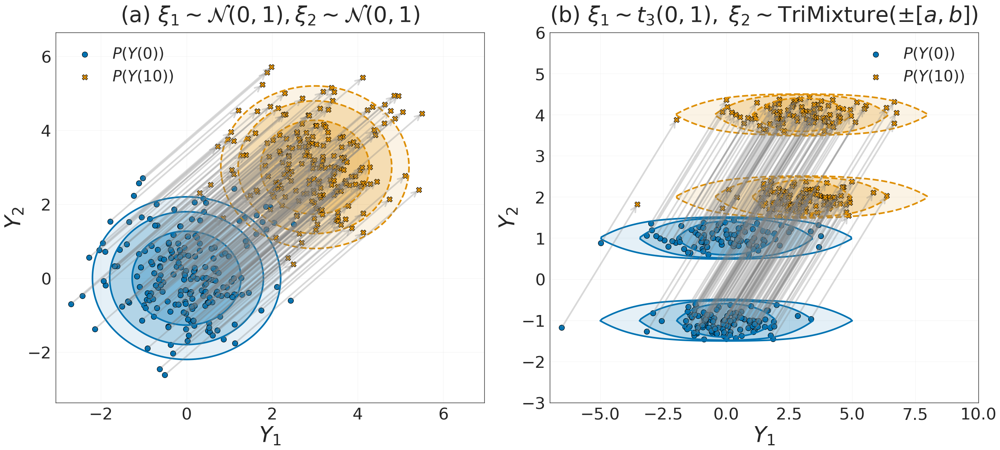

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, t

# Suppress font_manager messages
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style and colour-blind palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 2)

# -------------------------------  data  -------------------------------------
np.random.seed(1)
n_big, n_scatter = 1000, 200

# Linear map A (2×1)
A = np.array([[0.3], [0.3]])
A1, A2 = A[0,0], A[1,0]

delta = 10.0  # shift from x=0 to x=10
df = 3

# --- noise case (a): both coordinates Gaussian ---------------------------
U1 = np.random.normal(0, 1, size=n_big)
U2 = np.random.normal(0, 1, size=n_big)
Y0_norm = np.column_stack([U1, U2])  # Y at x=0
Y10_norm = Y0_norm + delta * A.T     # Y at x=10

# --- noise case (b): coord1 Student-t, coord2 mixture of triangulars -------
U1_b = np.random.standard_t(df=df, size=n_big)
flip = np.random.rand(n_big) < 0.5
a, b = -1.5, -0.5
c, d = 0.5, 1.5
U2_b = np.where(
    flip,
    np.random.triangular(a, 0.5*(a+b), b, size=n_big),
    np.random.triangular(c, 0.5*(c+d), d, size=n_big)
)
Y0_mix = np.column_stack([U1_b, U2_b])  # Y at x=0
Y10_mix = Y0_mix + delta * A.T         # Y at x=10

# helper: equal spans per panel
def get_limits(Y0, Y1, pad=0.0):
    y1_min = min(Y0[:,0].min(), Y1[:,0].min()) - pad
    y1_max = max(Y0[:,0].max(), Y1[:,0].max()) + pad
    y2_min = min(Y0[:,1].min(), Y1[:,1].min()) - pad
    y2_max = max(Y0[:,1].max(), Y1[:,1].max()) + pad
    span = max(y1_max - y1_min, y2_max - y2_min)
    mid1 = 0.5*(y1_max + y1_min)
    mid2 = 0.5*(y2_max + y2_min)
    return mid1 - span/2, mid1 + span/2, mid2 - span/2, mid2 + span/2

lims_norm = get_limits(Y0_norm, Y10_norm)
lims_mix = get_limits(Y0_mix, Y10_mix)

# random subset for arrows
idx = np.random.choice(n_big, n_scatter, replace=False)

# triangular PDF helper
def tri_pdf(u, a, b):
    m = 0.5*(a+b)
    base = b - a
    dens = np.zeros_like(u)
    left = (u >= a) & (u < m)
    dens[left] = 2*(u[left] - a)/(base**2)
    right = (u >= m) & (u <= b)
    dens[right] = 2*(b - u[right])/(base**2)
    return dens

# -----------------------------  analytic densities  -------------------------
def pdf_norm(y1, y2):
    return norm.pdf(y1) * norm.pdf(y2)

def pdf_mix(y1, y2):
    mix_tri = 0.5*tri_pdf(y2, a, b) + 0.5*tri_pdf(y2, c, d)
    return t.pdf(y1, df=df) * mix_tri

# -----------------------------  plotting  -----------------------------------
def make_panel(ax, Y0, Y1, pdf_fn, title, arrow_idx, limits, q_levels):
    y1_min, y1_max, y2_min, y2_max = limits
    y1g, y2g = np.mgrid[y1_min:y1_max:200j, y2_min:y2_max:200j]
    z0 = pdf_fn(y1g, y2g)
    z1 = pdf_fn(y1g - delta*A1, y2g - delta*A2)

    # compute quantile-based contours
    levels0 = np.quantile(z0.ravel(), q_levels)
    levels1 = np.quantile(z1.ravel(), q_levels)
    alphas = [0.1, 0.3, 0.5]

    for data, color, ls, levels in [
        (z0, palette[0], 'solid', levels0),
        (z1, palette[1], 'dashed', levels1)
    ]:
        # filled contours for each interval, including outermost
        for i in range(len(levels)):
            low = levels[i]
            high = levels[i+1] if i < len(levels)-1 else np.nanmax(data)
            ax.contourf(y1g, y2g, data, levels=[low, high], colors=[color], alpha=alphas[i], antialiased=True)
        ax.contour(y1g, y2g, data, levels=levels, colors=[color], linestyles=ls, linewidths=3)

    # scatter and arrows
    ax.scatter(Y0[arrow_idx,0], Y0[arrow_idx,1], color=palette[0], s=100, label=r'$P(Y(0))$', edgecolor='black')
    ax.scatter(Y1[arrow_idx,0], Y1[arrow_idx,1], color=palette[1], s=100, marker='X', label=r'$P(Y(10))$', edgecolor='black')
    for i in arrow_idx:
        ax.annotate('', xy=(Y1[i,0],Y1[i,1]), xytext=(Y0[i,0],Y0[i,1]), arrowprops=dict(arrowstyle='->', color='grey', lw=3, alpha=0.3))

    ax.set_xlim(y1_min, y1_max)
    ax.set_ylim(y2_min, y2_max)
    ax.set_title(title, fontsize=40, pad=20)
    ax.set_xlabel(r'$Y_1$', fontsize=40)
    ax.set_ylabel(r'$Y_2$', fontsize=40)
    ax.tick_params(labelsize=30)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=28, frameon=False)

fig, axes = plt.subplots(1, 2, figsize=(26, 12))
make_panel(axes[0], Y0_norm, Y10_norm, pdf_norm,
           r'(a) $\xi_1 \sim \mathcal{N}(0,1), \xi_2  \sim \mathcal{N}(0,1)$', idx, lims_norm, [0.85, 0.9, 0.95])
make_panel(axes[1], Y0_mix, Y10_mix, pdf_mix,
           r'(b) $\xi_1\sim t_{3}(0,1),\;\xi_2\sim\mathrm{TriMixture}(\pm [a,b])$', idx, (-7,10, -3,
 6), [0.9, 0.935, 0.97])

plt.tight_layout()
plt.savefig("Noise_invariance_Y2d_Y0_vs_Y10_triangular.png", bbox_inches="tight")
plt.show()

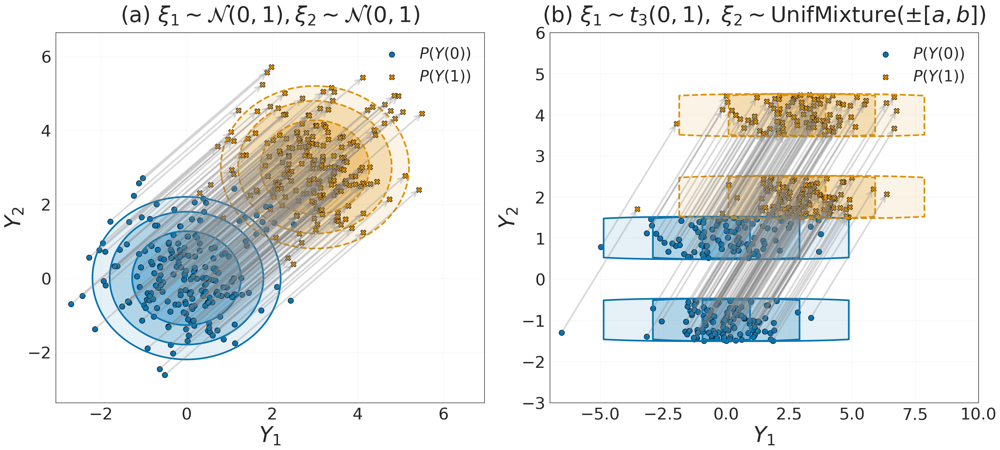

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, t

# Suppress font_manager messages
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style and colour‐blind palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 2)

# -------------------------------  data  -------------------------------------
np.random.seed(1)
n_big, n_scatter = 1000, 200

# Linear map A (2×1)
A = np.array([[0.3], [0.3]])
A1, A2 = A[0,0], A[1,0]

delta = 10.0  # shift from x=0 to x=10
df = 3

# --- noise case (a): both coordinates Gaussian ---------------------------
U1 = np.random.normal(0, 1, size=n_big)
U2 = np.random.normal(0, 1, size=n_big)
Y0_norm = np.column_stack([U1, U2])  # Y at x=0
Y10_norm = Y0_norm + delta * A.T     # Y at x=10

# --- noise case (b): coord1 Student-t, coord2 mixture of uniforms -------
U1_b = np.random.standard_t(df=df, size=n_big)
flip = np.random.rand(n_big) < 0.5
a, b = -1.5, -0.5
c, d = 0.5, 1.5
U2_b = np.where(
    flip,
    np.random.uniform(a, b, size=n_big),
    np.random.uniform(c, d, size=n_big)
)
Y0_mix = np.column_stack([U1_b, U2_b])  # Y at x=0
Y10_mix = Y0_mix + delta * A.T          # Y at x=10

# helper: equal spans per panel
def get_limits(Y0, Y1, pad=0.0):
    y1_min = min(Y0[:,0].min(), Y1[:,0].min()) - pad
    y1_max = max(Y0[:,0].max(), Y1[:,0].max()) + pad
    y2_min = min(Y0[:,1].min(), Y1[:,1].min()) - pad
    y2_max = max(Y0[:,1].max(), Y1[:,1].max()) + pad
    span = max(y1_max - y1_min, y2_max - y2_min)
    mid1 = 0.5*(y1_max + y1_min)
    mid2 = 0.5*(y2_max + y2_min)
    return mid1 - span/2, mid1 + span/2, mid2 - span/2, mid2 + span/2

lims_norm = get_limits(Y0_norm, Y10_norm)
lims_mix  = get_limits(Y0_mix,  Y10_mix)

# random subset for arrows
idx = np.random.choice(n_big, n_scatter, replace=False)

# -----------------------------  analytic densities  -------------------------
def pdf_norm(y1, y2):
    return norm.pdf(y1) * norm.pdf(y2)

def pdf_mix(y1, y2):
    # mixture of uniforms on [a,b] and [c,d]
    uni1 = ((y2 >= a) & (y2 <= b)) / (b - a)
    uni2 = ((y2 >= c) & (y2 <= d)) / (d - c)
    mix_uni = 0.5 * uni1 + 0.5 * uni2
    return t.pdf(y1, df=df) * mix_uni

# -----------------------------  plotting  -----------------------------------
def make_panel(ax, Y0, Y1, pdf_fn, title, arrow_idx, limits, q_levels):
    y1_min, y1_max, y2_min, y2_max = limits
    y1g, y2g = np.mgrid[y1_min:y1_max:200j, y2_min:y2_max:200j]
    z0 = pdf_fn(y1g, y2g)
    z1 = pdf_fn(y1g - delta*A1, y2g - delta*A2)

    # compute quantile-based contours
    levels0 = np.quantile(z0.ravel(), q_levels)
    levels1 = np.quantile(z1.ravel(), q_levels)
    alphas = [0.1, 0.3, 0.5]

    for data, color, ls, levels in [
        (z0, palette[0], 'solid', levels0),
        (z1, palette[1], 'dashed', levels1)
    ]:
        for i in range(len(levels)):
            low = levels[i]
            high = levels[i+1] if i < len(levels)-1 else np.nanmax(data)
            ax.contourf(y1g, y2g, data, levels=[low, high],
                        colors=[color], alpha=alphas[i], antialiased=True)
        ax.contour(y1g, y2g, data, levels=levels,
                   colors=[color], linestyles=ls, linewidths=3)

    ax.scatter(Y0[arrow_idx,0], Y0[arrow_idx,1],
               color=palette[0], s=100,
               label=r'$P(Y(0))$', edgecolor='black')
    ax.scatter(Y1[arrow_idx,0], Y1[arrow_idx,1],
               color=palette[1], s=100, marker='X',
               label=r'$P(Y(1))$', edgecolor='black')
    for i in arrow_idx:
        ax.annotate('', xy=(Y1[i,0],Y1[i,1]),
                    xytext=(Y0[i,0],Y0[i,1]),
                    arrowprops=dict(arrowstyle='->',
                                    color='grey', lw=3, alpha=0.3))

    ax.set_xlim(limits[0], limits[1])
    ax.set_ylim(limits[2], limits[3])
    ax.set_title(title, fontsize=40, pad=20)
    ax.set_xlabel(r'$Y_1$', fontsize=40)
    ax.set_ylabel(r'$Y_2$', fontsize=40)
    ax.tick_params(labelsize=30)
    ax.grid(alpha=0.2)
    ax.legend(fontsize=28, frameon=False)

fig, axes = plt.subplots(1, 2, figsize=(26, 12))
make_panel(axes[0], Y0_norm, Y10_norm, pdf_norm,
           r'(a) $\xi_1 \sim \mathcal{N}(0,1), \xi_2  \sim \mathcal{N}(0,1)$', idx, lims_norm, [0.85, 0.9, 0.95])
make_panel(axes[1], Y0_mix, Y10_mix, pdf_mix,
           r'(b) $\xi_1\sim t_{3}(0,1),\;\xi_2\sim\mathrm{UnifMixture}(\pm [a,b])$', idx, (-7,10, -3,
 6), [0.875, 0.925, 0.975])

plt.tight_layout()
plt.savefig("Noise_invariance_Y2d_uniform_mix.png", bbox_inches="tight")
plt.show()

/tmp/ipykernel_4152936/2629220805.py:71: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Xs, Ys,   c=palette[0], s=scatter_size, edgecolor='black',
/tmp/ipykernel_4152936/2629220805.py:73: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Xsφ, Ysφ, c=palette[1], s=scatter_size, marker='X', edgecolor='black',
/tmp/ipykernel_4152936/2629220805.py:95: UserWarning: *c* argument looks like a single numeric RGB or 

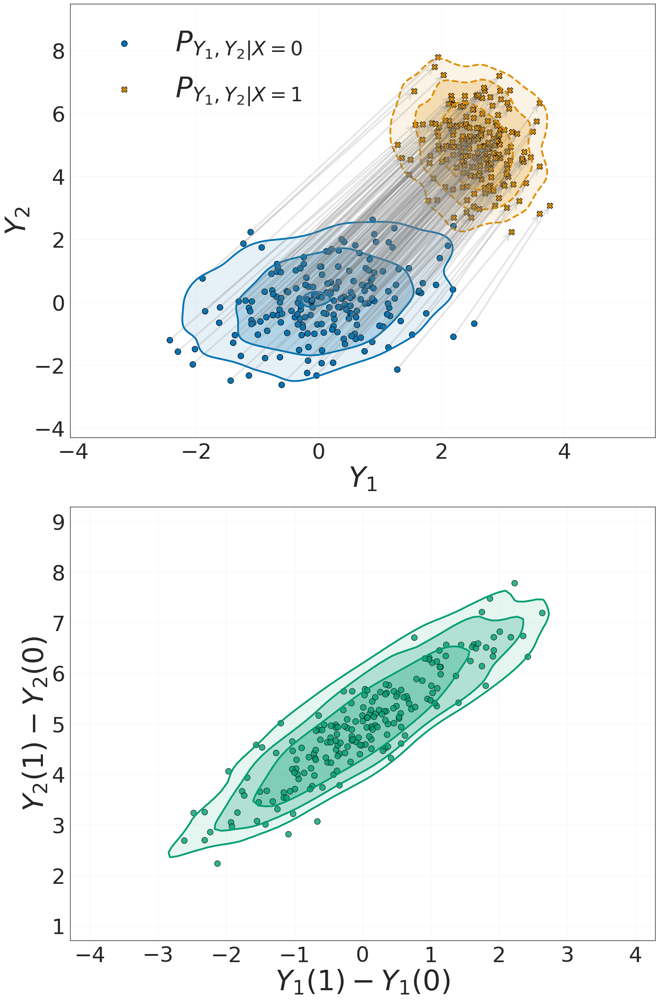

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde
import logging

# Suppress font_manager messages
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style and 3-color palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 3)  # blue, orange, green

# Data generation (unchanged)
np.random.seed(1)
n_scatter, n_kde = 200, 1000

def make_sample(n):
    X = np.random.normal(0, 1, n)
    Y = 0.3 * X + np.random.normal(0, 1, n)
    sx, dX, dY = 0.5, 2.5, 2.5
    Xφ = sx * X + dX
    Yφ = Y - X + Xφ + dY
    return X, Y, Xφ, Yφ

X, Y, Xφ, Yφ = make_sample(n_kde)
Xs, Ys, Xsφ, Ysφ = X[:n_scatter], Y[:n_scatter], Xφ[:n_scatter], Yφ[:n_scatter]

# KDE of (X, Y) and (Xφ, Yφ) (unchanged)
kde_xy  = gaussian_kde(np.vstack([X, Y]))
kde_xyφ = gaussian_kde(np.vstack([Xφ, Yφ]))
xmin, xmax = min(X.min(), Xφ.min()) - 1, max(X.max(), Xφ.max()) + 1
ymin, ymax = min(Y.min(), Yφ.min()) - 1, max(Y.max(), Yφ.max()) + 1

xx, yy = np.mgrid[xmin:xmax:150j, ymin:ymax:150j]
grid   = np.vstack([xx.ravel(), yy.ravel()])
z      = kde_xy(grid).reshape(xx.shape)
zφ     = kde_xyφ(grid).reshape(xx.shape)

# Levels for panel (a) (unchanged)
levels_a = np.quantile(np.hstack([z.ravel(), zφ.ravel()]), [0.9, 0.95, 0.99])

# KDE of joint (Y, Yφ) (unchanged data; we will only relabel)
joint_kde = gaussian_kde(np.vstack([Y, Yφ]))
yy1, yy2 = np.mgrid[ymin:ymax:150j, ymin:ymax:150j]
z_joint  = joint_kde(np.vstack([yy1.ravel(), yy2.ravel()])).reshape(yy1.shape)
levels_b = np.quantile(z_joint[z_joint>0], [0.925, 0.95, 0.975])

# Plot (stacked vertically)
fig, axes = plt.subplots(2, 1, figsize=(16, 24))

# Settings
scatter_size = 100
arrow_lw     = 3
contour_lw   = 3
alphas       = [0.1, 0.3, 0.5]
fs_axis      = 48
fs_tick      = 36
fs_legend    = 48

# Panel (a): relabeled to Y1,Y2 and P(Y(0))->P(Y(1))
ax = axes[0]
for data, color, ls in [(z, palette[0], 'solid'), (zφ, palette[1], 'dashed')]:
    for i, lev in enumerate(levels_a):
        low  = lev
        high = 1.0 if i == len(levels_a) - 1 else levels_a[i+1]
        ax.contourf(xx, yy, data, levels=[low, high], colors=[color], alpha=alphas[i], antialiased=True)
    ax.contour(xx, yy, data, levels=levels_a, colors=[color], linestyles=ls, linewidths=contour_lw)

ax.scatter(Xs, Ys,   c=palette[0], s=scatter_size, edgecolor='black',
           label=r'$P_{Y_1,Y_2|X=0}$')
ax.scatter(Xsφ, Ysφ, c=palette[1], s=scatter_size, marker='X', edgecolor='black',
           label=r'$P_{Y_1,Y_2|X=1}$')
for x,y,xp,yp in zip(Xs, Ys, Xsφ, Ysφ):
    ax.annotate("", xy=(xp, yp), xytext=(x, y),
                arrowprops=dict(arrowstyle="->", color="grey", lw=arrow_lw, alpha=0.2))

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_xlabel(r"$Y_1$", fontsize=fs_axis)
ax.set_ylabel(r"$Y_2$", fontsize=fs_axis)
ax.tick_params(labelsize=fs_tick)
ax.grid(alpha=0.2)
ax.legend(fontsize=fs_legend, frameon=False)

# Panel (b): same data (Y vs Yφ), just relabeled as differences
ax = axes[1]
for i, lev in enumerate(levels_b):
    low  = lev
    high = 1.0 if i == len(levels_b) - 1 else levels_b[i+1]
    ax.contourf(yy1, yy2, z_joint, levels=[low, high], colors=[palette[2]], alpha=alphas[i], antialiased=True)
ax.contour(yy1, yy2, z_joint, levels=levels_b, colors=[palette[2]], linestyles='solid', linewidths=contour_lw)

ax.scatter(Ys, Ysφ, c=palette[2], s=scatter_size, edgecolor='black', alpha=0.8)

# Keep original limits, just relabel axes
ax.set_xlim(ymin, -ymin)
ax.set_ylim(ymin+5, -ymin+5)
ax.set_xlabel(r"$Y_1(1)-Y_1(0)$", fontsize=fs_axis)
ax.set_ylabel(r"$Y_2(1)-Y_2(0)$", fontsize=fs_axis)
ax.tick_params(labelsize=fs_tick)
ax.grid(alpha=0.2)

plt.tight_layout()
plt.savefig("Noise_invariance_Y_relabel_only_vertical.png", bbox_inches="tight")
plt.show()

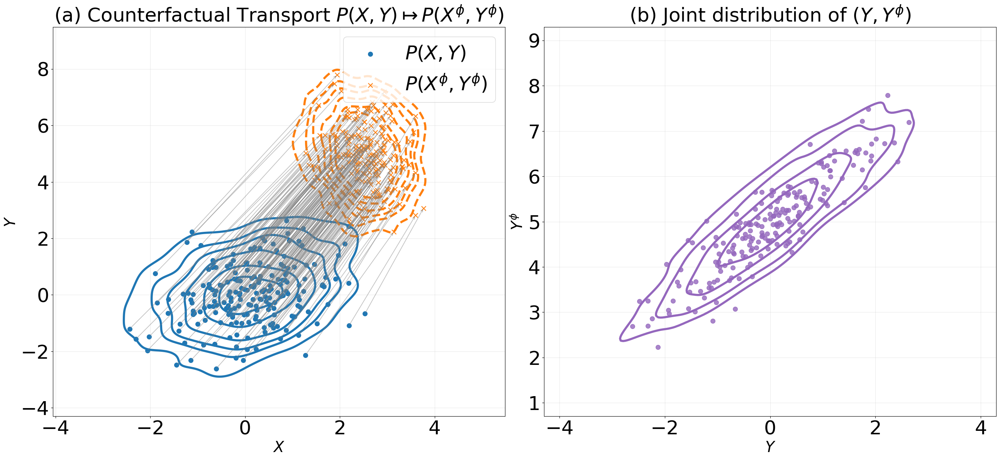

In [266]:
# ------------------------------------------------------------
# Transport illustration with enlarged figure, thicker lines,
# larger points, and keeping your original titles/text
# ------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

np.random.seed(1)

# ------------------------------------------------------------------
# 1) generate two independent samples
n_scatter = 200          # what the reader sees
n_kde     = 1000          # what the contours are built from

def make_sample(n):
    X = np.random.normal(0, 1, n)
    Y = 0.3*X + np.random.normal(0, 1, n)
    sx, dX, dY = 0.5, 2.5, 2.5
    X_phi = sx*X + dX
    Y_phi = Y - X + X_phi + dY
    return X, Y, X_phi, Y_phi

X , Y ,  X_phi , Y_phi  = make_sample(n_kde)
Xs, Ys, Xs_phi, Ys_phi  = X[:n_scatter], Y[:n_scatter], X_phi[:n_scatter], Y_phi[:n_scatter]

# ------------------------------------------------------------------
# 2) KDEs (built from the *big* sample)
xy      = np.vstack([X,  Y ])
xy_phi  = np.vstack([X_phi, Y_phi])
kde_xy  = gaussian_kde(xy)
kde_xyφ = gaussian_kde(xy_phi)

xmin, xmax = min(X.min(),  X_phi.min())-1 , max(X.max(),  X_phi.max())+1
ymin, ymax = min(Y.min(),  Y_phi.min())-1 , max(Y.max(),  Y_phi.max())+1

xx, yy = np.mgrid[xmin:xmax:350j, ymin:ymax:350j]
grid   = np.vstack([xx.ravel(), yy.ravel()])
z      = kde_xy (grid).reshape(xx.shape)
z_phi  = kde_xyφ(grid).reshape(xx.shape)

levels_xy = np.quantile(z, [0.85,0.90,0.925,0.95,0.975,0.99])

# ------------------------------------------------------------------
# 3) KDE on (Y ,Yφ)
Yjoint  = np.vstack([Y, Y_phi])
kde_joint = gaussian_kde(Yjoint)
yy1, yy2 = np.mgrid[ymin:ymax:350j, ymin:ymax:350j]
z_joint  = kde_joint(np.vstack([yy1.ravel(), yy2.ravel()])).reshape(yy1.shape)
levels_yy = np.quantile(z_joint[z_joint>0],[0.925,0.95,0.975,0.99])

# ------------------------------------------------------------------
# 4) figure
fig, ax = plt.subplots(1, 2, figsize=(26, 12))  # Enlarged figure

# Font sizes
fontsize_axis = 28
fontsize_label = 36
fontsize_title = 36
fontsize_legend = 36

# Plot settings
scatter_size = 70
line_width = 4.0

# (a) scatter + arrows + contours in (X,Y)
ax[0].scatter(Xs , Ys ,      c="tab:blue",   s=scatter_size, label=r"$P(X,Y)$")
ax[0].scatter(Xs_phi, Ys_phi, c="tab:orange", s=scatter_size, marker="x", label=r"$P(X^{\phi}, Y^{\phi})$")
for x,y,xp,yp in zip(Xs, Ys, Xs_phi, Ys_phi):
    ax[0].annotate("", xy=(xp, yp), xytext=(x, y),
                   arrowprops=dict(arrowstyle="->", color="grey", lw=1.2, alpha=0.5))
ax[0].contour(xx, yy, z,      levels=levels_xy, linestyles="solid",  colors="tab:blue", linewidths=line_width)
ax[0].contour(xx, yy, z_phi,  levels=levels_xy, linestyles="dashed", colors="tab:orange", linewidths=line_width)
ax[0].set_xlabel("$X$", fontsize=fontsize_axis)
ax[0].set_ylabel("$Y$", fontsize=fontsize_axis)
ax[0].set_title("(a) Counterfactual Transport $P(X,Y) \\mapsto P(X^{\\phi},Y^{\\phi})$", fontsize=fontsize_title)
ax[0].legend(fontsize=fontsize_legend)
ax[0].tick_params(labelsize=fontsize_label)
ax[0].grid(alpha=0.25)

# (b) joint (Y,Yφ)
ax[1].scatter(Ys, Ys_phi, c="tab:purple", s=scatter_size, alpha=0.8)
ax[1].contour(yy1, yy2, z_joint, levels=levels_yy, colors="tab:purple", linewidths=line_width)
ax[1].set_xlabel("$Y$", fontsize=fontsize_axis)
ax[1].set_ylabel("$Y^{\\phi}$", fontsize=fontsize_axis)
ax[1].set_title("(b) Joint distribution of $(Y, Y^{\\phi})$", fontsize=fontsize_title)
ax[1].tick_params(labelsize=fontsize_label)
ax[1].grid(alpha=0.25)
ax[1].set_xlim(ymin, -ymin)
ax[1].set_ylim(ymin+5, -ymin+5)

plt.tight_layout()
plt.savefig("Counterfactual_transport_sufficiency_final.png", bbox_inches="tight")
plt.show()

/tmp/ipykernel_25666/3488137541.py:73: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Xs, Ys,   c=palette[0], s=scatter_size, edgecolor='black', label=r'$P(X,Y)$')
/tmp/ipykernel_25666/3488137541.py:74: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(Xsφ, Ysφ, c=palette[1], s=scatter_size, marker='X', edgecolor='black', label=r'$P(X^\phi,Y^\phi)$')
/tmp/ipykernel_25666/3488137541.py:97: UserWarning: *c* ar

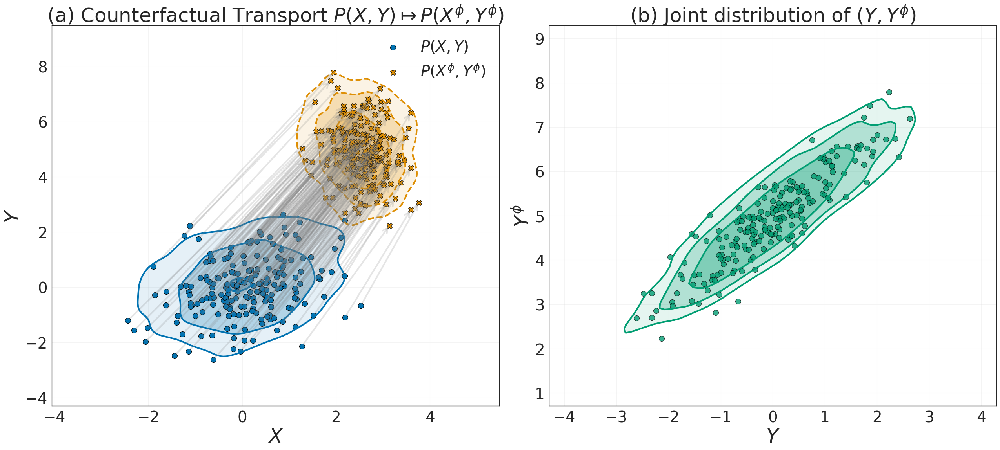

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde
import logging

# Suppress font_manager messages
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style and 3-color palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 3)  # blue, orange, green

# Data generation
np.random.seed(1)
n_scatter, n_kde = 200, 1000

def make_sample(n):
    X = np.random.normal(0, 1, n)
    Y = 0.3 * X + np.random.normal(0, 1, n)
    sx, dX, dY = 0.5, 2.5, 2.5
    Xφ = sx * X + dX
    Yφ = Y - X + Xφ + dY
    return X, Y, Xφ, Yφ

X, Y, Xφ, Yφ = make_sample(n_kde)
Xs, Ys, Xsφ, Ysφ = X[:n_scatter], Y[:n_scatter], Xφ[:n_scatter], Yφ[:n_scatter]

# KDE of (X, Y)
kde_xy  = gaussian_kde(np.vstack([X, Y]))
kde_xyφ = gaussian_kde(np.vstack([Xφ, Yφ]))
xmin, xmax = min(X.min(), Xφ.min()) - 1, max(X.max(), Xφ.max()) + 1
ymin, ymax = min(Y.min(), Yφ.min()) - 1, max(Y.max(), Yφ.max()) + 1

# Grid for shading panels
xx, yy = np.mgrid[xmin:xmax:150j, ymin:ymax:150j]
grid   = np.vstack([xx.ravel(), yy.ravel()])
z      = kde_xy(grid).reshape(xx.shape)
zφ     = kde_xyφ(grid).reshape(xx.shape)

# Levels for panel (a)
levels_a = np.quantile(np.hstack([z.ravel(), zφ.ravel()]), [0.9, 0.95, 0.99])

# KDE of joint (Y, Yφ)
joint_kde = gaussian_kde(np.vstack([Y, Yφ]))
yy1, yy2 = np.mgrid[ymin:ymax:150j, ymin:ymax:150j]
z_joint  = joint_kde(np.vstack([yy1.ravel(), yy2.ravel()])).reshape(yy1.shape)
levels_b = np.quantile(z_joint[z_joint>0], [0.925, 0.95, 0.975])

# Plot
fig, axes = plt.subplots(1, 2, figsize=(26, 12))

# Settings
scatter_size = 100
arrow_lw     = 3
contour_lw   = 3
alphas       = [0.1, 0.3, 0.5]
fs_axis      = 36
fs_tick      = 28
fs_title     = 36
fs_legend    = 28

# Panel (a): blue->orange shading
ax = axes[0]
for data, color, ls in [(z, palette[0], 'solid'), (zφ, palette[1], 'dashed')]:
    for i, lev in enumerate(levels_a):
        low  = lev
        high = 1.0 if i == len(levels_a) - 1 else levels_a[i+1]
        ax.contourf(xx, yy, data, levels=[low, high], colors=[color], alpha=alphas[i], antialiased=True)
    ax.contour(xx, yy, data, levels=levels_a, colors=[color], linestyles=ls, linewidths=contour_lw)

ax.scatter(Xs, Ys,   c=palette[0], s=scatter_size, edgecolor='black', label=r'$P(X,Y)$')
ax.scatter(Xsφ, Ysφ, c=palette[1], s=scatter_size, marker='X', edgecolor='black', label=r'$P(X^\phi,Y^\phi)$')
for x,y,xp,yp in zip(Xs, Ys, Xsφ, Ysφ):
    ax.annotate("", xy=(xp, yp), xytext=(x, y),
                arrowprops=dict(arrowstyle="->", color="grey", lw=arrow_lw, alpha=0.2))

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_title("(a) Counterfactual Transport $P(X,Y) \\mapsto P(X^{\\phi},Y^{\\phi})$", fontsize=fs_title)
ax.set_xlabel("$X$", fontsize=fs_axis)
ax.set_ylabel("$Y$", fontsize=fs_axis)
ax.tick_params(labelsize=fs_tick)
ax.grid(alpha=0.2)
ax.legend(fontsize=fs_legend, frameon=False)

# Panel (b): green shading, same style
ax = axes[1]
for data, color, ls in [(z_joint, palette[2], 'solid')]:
    for i, lev in enumerate(levels_b):
        low  = lev
        high = 1.0 if i == len(levels_b) - 1 else levels_b[i+1]
        ax.contourf(yy1, yy2, data, levels=[low, high], colors=[color], alpha=alphas[i], antialiased=True)
    ax.contour(yy1, yy2, data, levels=levels_b, colors=[color], linestyles='solid', linewidths=contour_lw)

ax.scatter(Ys, Ysφ, c=palette[2], s=scatter_size, edgecolor='black', alpha=0.8)
ax.set_xlim(ymin, -ymin)
ax.set_ylim(ymin+5, -ymin+5)
ax.set_title("(b) Joint distribution of $(Y, Y^{\\phi})$", fontsize=fs_title)
ax.set_xlabel("$Y$", fontsize=fs_axis)
ax.set_ylabel("$Y^{\\phi}$", fontsize=fs_axis)
ax.tick_params(labelsize=fs_tick)
ax.grid(alpha=0.2)

plt.tight_layout()
plt.savefig("Noise_invariance_2d_green_rhs.png", bbox_inches="tight")
plt.show()

<>:106: SyntaxWarning: invalid escape sequence '\p'
<>:117: SyntaxWarning: invalid escape sequence '\p'
<>:106: SyntaxWarning: invalid escape sequence '\p'
<>:117: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipykernel_3041784/3004528460.py:106: SyntaxWarning: invalid escape sequence '\p'
  ax.set_ylabel("$Y^{\phi}$",fontsize=fs_axis)
/tmp/ipykernel_3041784/3004528460.py:117: SyntaxWarning: invalid escape sequence '\p'
  ax.set_title("(c) Distribution of $Y^{\phi} - Y$",fontsize=fs_title)


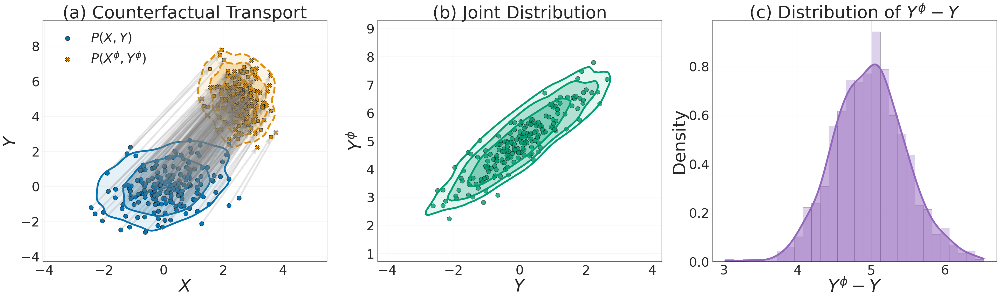

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde
import logging

# Suppress font_manager messages
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Seaborn style + palette
sns.set_style("white")
sns.set_context("paper", font_scale=2.4)
palette = sns.color_palette("colorblind", 3)  # blue, orange, green

# Data generation
np.random.seed(1)
n_scatter, n_kde = 200, 1000
def make_sample(n):
    X = np.random.normal(0, 1, n)
    Y = 0.3*X + np.random.normal(0, 1, n)
    sx, dX, dY = 0.5, 2.5, 2.5
    Xφ = sx*X + dX
    Yφ = Y - X + Xφ + dY
    return X, Y, Xφ, Yφ

X, Y, Xφ, Yφ = make_sample(n_kde)
Xs, Ys, Xsφ, Ysφ = X[:n_scatter], Y[:n_scatter], Xφ[:n_scatter], Yφ[:n_scatter]

# (a) KDE of (X,Y) and (Xφ,Yφ)
kde_xy  = gaussian_kde(np.vstack([X, Y]))
kde_xyφ = gaussian_kde(np.vstack([Xφ, Yφ]))
xmin, xmax = min(X.min(),Xφ.min())-1, max(X.max(),Xφ.max())+1
ymin, ymax = min(Y.min(),Yφ.min())-1, max(Y.max(),Yφ.max())+1
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]  # reduced grid resolution
grid   = np.vstack([xx.ravel(), yy.ravel()])
z      = kde_xy(grid).reshape(xx.shape)
zφ     = kde_xyφ(grid).reshape(xx.shape)
levels_a = np.quantile(np.hstack([z.ravel(), zφ.ravel()]), [0.9,0.95,0.99])

# (b) KDE of joint (Y,Yφ)
joint_kde = gaussian_kde(np.vstack([Y, Yφ]))
yy1, yy2 = np.mgrid[ymin:ymax:100j, ymin:ymax:100j]
z_joint  = joint_kde(np.vstack([yy1.ravel(), yy2.ravel()])).reshape(yy1.shape)
levels_b = np.quantile(z_joint[z_joint>0], [0.925,0.95,0.975])

# (c) KDE of the difference
diff = Yφ - Y
kde_diff = gaussian_kde(diff)
diff_grid = np.linspace(diff.min(), diff.max(), 400)
diff_kde  = kde_diff(diff_grid)

# Plot
fig, axes = plt.subplots(1, 3, figsize=(39, 12))

# Common style
scatter_size = 150
arrow_lw     = 5
contour_lw   = 5
alphas       = [0.1,0.3,0.5]
fs_axis      = 48
fs_tick      = 36
fs_title     = 48
fs_legend    = 36

# Panel (a)
ax = axes[0]
for data,color,ls in [(z,palette[0],'solid'), (zφ,palette[1],'dashed')]:
    for i,lev in enumerate(levels_a):
        low, high = lev, (1.0 if i==len(levels_a)-1 else levels_a[i+1])
        ax.contourf(xx, yy, data, levels=[low,high],
                    colors=[color], alpha=alphas[i])
    ax.contour(xx, yy, data, levels=levels_a,
               colors=[color], linestyles=ls, linewidths=contour_lw)

ax.scatter(Xs, Ys,   color=palette[0], s=scatter_size,
           edgecolor='black', label=r'$P(X,Y)$')
ax.scatter(Xsφ,Ysφ,  color=palette[1], s=scatter_size,
           marker='X', edgecolor='black', label=r'$P(X^\phi,Y^\phi)$')
for x,y,xp,yp in zip(Xs,Ys,Xsφ,Ysφ):
    ax.annotate("", xy=(xp,yp), xytext=(x,y),
                arrowprops=dict(arrowstyle="->", color="grey",
                                lw=arrow_lw,alpha=0.2))

ax.set_xlim(xmin,xmax); ax.set_ylim(ymin,ymax)
ax.set_title("(a) Counterfactual Transport",fontsize=fs_title)
ax.set_xlabel("$X$",fontsize=fs_axis)
ax.set_ylabel("$Y$",fontsize=fs_axis)
ax.tick_params(labelsize=fs_tick); ax.grid(alpha=0.2)
ax.legend(fontsize=fs_legend,frameon=False)

# Panel (b): restored shading
ax = axes[1]
for data,color in [(z_joint, palette[2])]:
    for i,lev in enumerate(levels_b):
        low, high = lev, (1.0 if i==len(levels_b)-1 else levels_b[i+1])
        ax.contourf(yy1, yy2, data, levels=[low,high],
                    colors=[color], alpha=alphas[i])
    ax.contour(yy1, yy2, data, levels=levels_b,
               colors=[color], linestyles='solid', linewidths=contour_lw)

ax.scatter(Ys, Ysφ, color=palette[2], s=scatter_size,
           edgecolor='black', alpha=0.8)
ax.set_xlim(ymin,-ymin); ax.set_ylim(ymin+5,-ymin+5)
ax.set_title("(b) Joint Distribution",fontsize=fs_title)
ax.set_xlabel("$Y$",fontsize=fs_axis)
ax.set_ylabel("$Y^{\phi}$",fontsize=fs_axis)
ax.tick_params(labelsize=fs_tick); ax.grid(alpha=0.2)

# Panel (c): KDE + histogram overlay
ax = axes[2]
ax.hist(diff, bins=30, density=True,
        color="C4", alpha=0.3, edgecolor='black')
ax.fill_between(diff_grid, diff_kde,
                color="C4", alpha=0.5)
ax.plot(diff_grid, diff_kde,
        color="C4", linewidth=contour_lw)
ax.set_title("(c) Distribution of $Y^{\phi} - Y$",fontsize=fs_title)
ax.set_xlabel(r"$Y^{\phi} - Y$",fontsize=fs_axis)
ax.set_ylabel("Density",fontsize=fs_axis)
ax.tick_params(labelsize=fs_tick); ax.grid(alpha=0.5)

plt.tight_layout()
plt.savefig("Counterfactual_transport_three_panels.png", bbox_inches="tight")
plt.show()

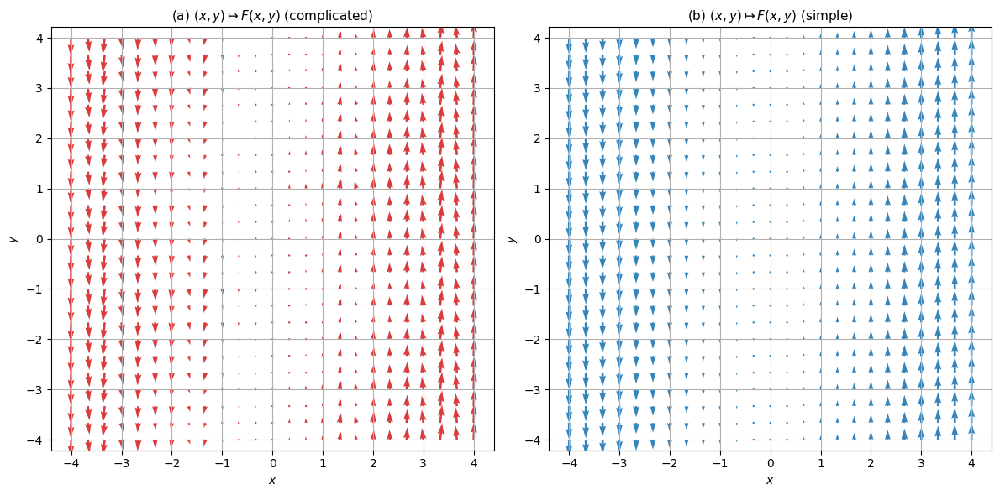

In [220]:
import numpy as np
import matplotlib.pyplot as plt

# Grid setup
N = 25
x_vals = np.linspace(-4, 4, N)
y_vals = np.linspace(-4, 4, N)
grid_x, grid_y = np.meshgrid(x_vals, y_vals)

def f(x): 
    return x + 0.3 * np.sin(10 * x) + 0.2 * np.sin(25 * x)     
def g(y): 
    return y + 0.3 * np.sin(8 * y) + 0.3 * np.sin(20 * y)


# Complicated F (mis-specified noise)
def F_complicated(x, y):
    f1 = f(x)  # monotonic in x
    f2 = f1 + g(y)
    return f1, f2
                                                   
# Simple lower-triangular F*
def F_simple(x, y, beta=1.0):
    return x, x + y

# Evaluate vector fields
Uc, Vc = F_complicated(grid_x, grid_y)
Us, Vs = F_simple(grid_x, grid_y, beta=1.0)


# Plot
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# (a) Vector field of complicated F
axes[0].quiver(grid_x, grid_y, Uc-grid_x, Vc-grid_y,
               angles='xy', scale_units='xy', scale=12,
               color='tab:red', width=0.005, alpha=0.9)
axes[0].set_title(r"(a) $(x,y) \mapsto F(x,y)$ (complicated)", fontsize=11)
axes[0].set_xlabel("$x$"); axes[0].set_ylabel("$y$")
axes[0].axis("equal"); axes[0].grid(True)

# (b) Vector field of simple F*
axes[1].quiver(grid_x, grid_y, Us-grid_x, Vs-grid_y,
               angles='xy', scale_units='xy', scale=12,
               color='tab:blue', width=0.005, alpha=0.9)
axes[1].set_title(r"(b) $(x,y) \mapsto F(x,y)$ (simple)", fontsize=11)
axes[1].set_xlabel("$x$"); axes[1].set_ylabel("$y$")
axes[1].axis("equal"); axes[1].grid(True)

plt.tight_layout()
plt.show()